# **COMPUTER VISION PROJECT**
# **Fall Detecttion Base on Skeleton**
Thành viên: 
## 1. Dương Tấn Nguyên - 1914365
## 2. Lý Minh Toàn - 1915545
## 3. Nguyên Quốc Đạt - 1913054
## 4. Lưu Đức Tuấn - 1915770


# Install Dependency

In [1]:
!pip install torch==1.12.0+cu113 torchvision==0.13.0+cu113 -f https://download.pytorch.org/whl/torch_stable.html

!pip install mmcv-full -f https://download.openmmlab.com/mmcv/dist/cu113/torch1.12.0/index.html


!git clone https://github.com/open-mmlab/mmdetection.git
%cd mmdetection

!pip install -e .
%cd .. 

!git clone https://github.com/open-mmlab/mmpose.git
%cd mmpose

# install mmpose dependencies
%pip install -r requirements.txt

# install mmpose in develop mode
%pip install -e .
%cd .. 
!git clone https://github.com/open-mmlab/mmaction2.git
%cd mmaction2

!pip install -e .

# Install some optional requirements
!pip install -r requirements/optional.txt
%cd ..

!pip install --upgrade numpy


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://download.pytorch.org/whl/torch_stable.html
     |██████████████▌                 | 834.1 MB 1.2 MB/s eta 0:13:43tcmalloc: large alloc 1147494400 bytes == 0x66376000 @  0x7f98c878c615 0x5d6f4c 0x51edd1 0x51ef5b 0x4f750a 0x4997a2 0x4fd8b5 0x4997c7 0x4fd8b5 0x49abe4 0x4f5fe9 0x55e146 0x4f5fe9 0x55e146 0x4f5fe9 0x55e146 0x5d8868 0x5da092 0x587116 0x5d8d8c 0x55dc1e 0x55cd91 0x5d8941 0x49abe4 0x55cd91 0x5d8941 0x4990ca 0x5d8868 0x4997a2 0x4fd8b5 0x49abe4
     |██████████████████▍             | 1055.7 MB 1.2 MB/s eta 0:11:19tcmalloc: large alloc 1434370048 bytes == 0x3b9e000 @  0x7f98c878c615 0x5d6f4c 0x51edd1 0x51ef5b 0x4f750a 0x4997a2 0x4fd8b5 0x4997c7 0x4fd8b5 0x49abe4 0x4f5fe9 0x55e146 0x4f5fe9 0x55e146 0x4f5fe9 0x55e146 0x5d8868 0x5da092 0x587116 0x5d8d8c 0x55dc1e 0x55cd91 0x5d8941 0x49abe4 0x55cd91 0x5d8941 0x4990ca 0x5d8868 0x4997a2 0x4fd8b5 0x49abe4
     |██████

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Obtaining file:///content/mmpose
  Running setup.py develop for mmpose
/content
Cloning into 'mmaction2'...
remote: Enumerating objects: 19859, done.
remote: Counting objects: 100% (394/394), done.
remote: Compressing objects: 100% (284/284), done.
remote: Total 19859 (delta 144), reused 281 (delta 103), pack-reused 19465
Receiving objects: 100% (19859/19859), 71.94 MiB | 22.61 MiB/s, done.
Resolving deltas: 100% (13946/13946), done.
/content/mmaction2
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Obtaining file:///content/mmaction2
     |████████████████████████████████| 13.6 MB 4.1 MB/s 
     |████████████████████████████████| 41 kB 508 kB/s 
  Running setup.py develop for mmaction2
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Ignoring dataclasses: markers 'python_version == "3.6"'

In [ ]:

import torch, torchvision
print(torch.__version__, torch.cuda.is_available())

# Check MMDetection installation
import mmdet
print(mmdet.__version__)


1.12.0+cu113 True
2.26.0


/usr/local/lib/python3.8/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(


# Extract Keypoints from video 
**Pipe Line:**


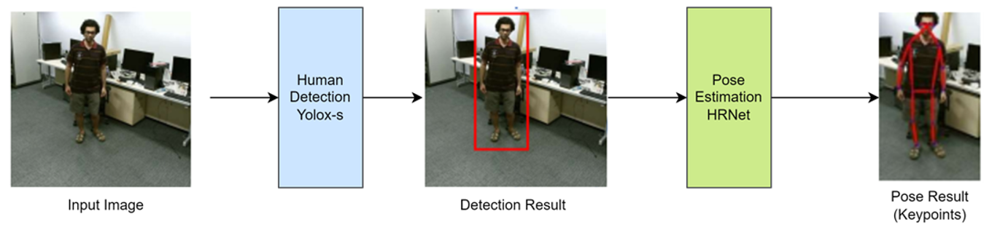


*   Each Keypoint: (x, y, score)

*   Pose result: `Tensort`: (17,3)



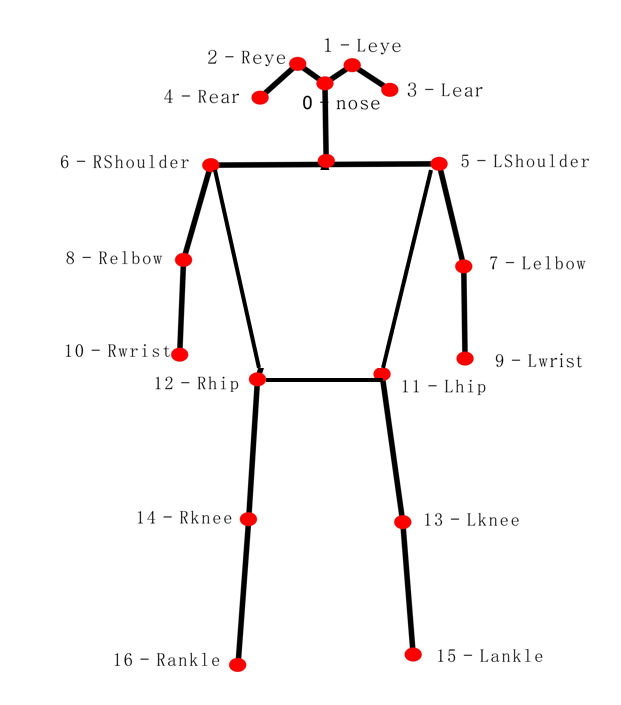

Extract Keypoint from video then save to pkl file
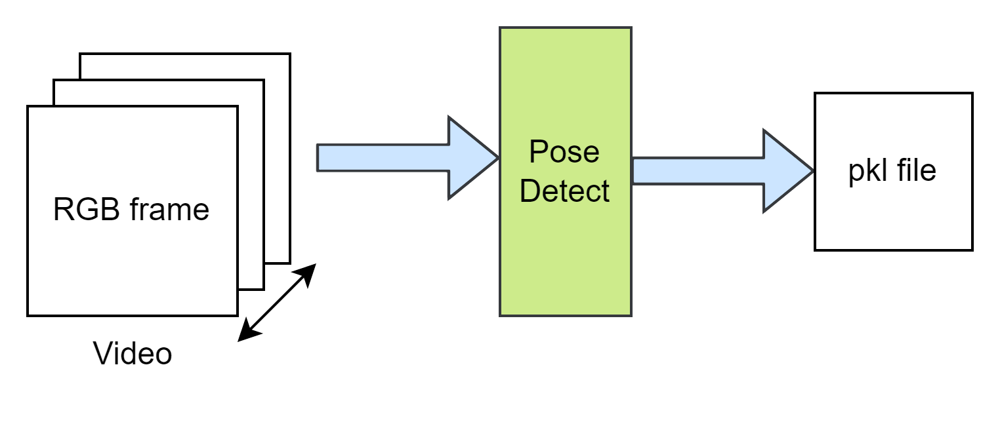

 Stack frame to list 

In [2]:
import sys
sys.path.append('/content/mmaction2')
sys.path.append('/content/mmdetection')
sys.path.append('/content/mmpose')

from mmdet.apis import inference_detector, init_detector



from mmpose.apis import inference_top_down_pose_model, init_pose_model



/usr/local/lib/python3.8/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(


ValueError: ignored

In [ ]:
import abc
import argparse
import os
import os.path as osp
import random as rd
import shutil
import string
from collections import defaultdict

import cv2
import mmcv
import numpy as np
mmdet_root = '/content/mmdetection'
mmpose_root = '/content/mmpose'

def extract_frame(video_path):
    dname = 'temp'
    os.makedirs(dname, exist_ok=True)
    frame_tmpl = osp.join(dname, 'img_{:05d}.jpg')
    vid = cv2.VideoCapture(video_path)
    frame_paths = []
    flag, frame = vid.read()
    cnt = 0
    while flag:
        frame_path = frame_tmpl.format(cnt + 1)
        frame_paths.append(frame_path)

        cv2.imwrite(frame_path, frame)
        cnt += 1
        flag, frame = vid.read()

    return frame_paths

def detection_inference(det_config, det_checkpoint ,frame_paths, det_score_thr=0.5,device='cuda' ):
    model = init_detector(det_config, det_checkpoint, device)
    assert model.CLASSES[0] == 'person', ('We require you to use a detector '
                                          'trained on COCO')
    results = []
    print('Performing Human Detection for each frame')
    prog_bar = mmcv.ProgressBar(len(frame_paths))
    for frame_path in frame_paths:
        result = inference_detector(model, frame_path)
        # We only keep human detections with score larger than det_score_thr
        result = result[0][result[0][:, 4] >= det_score_thr]
        results.append(result)
        prog_bar.update()
    return results

def pose_inference(pose_config,pose_checkpoint, frame_paths, det_results, device='cuda'):
    model = init_pose_model(pose_config, pose_checkpoint, device)
    print('Performing Human Pose Estimation for each frame')
    prog_bar = mmcv.ProgressBar(len(frame_paths))

    num_frame = len(det_results)
    num_person = max([len(x) for x in det_results])
    kp = np.zeros((num_person, num_frame, 17, 3), dtype=np.float32)

    for i, (f, d) in enumerate(zip(frame_paths, det_results)):
        # Align input format
        d = [dict(bbox=x) for x in list(d) if x[-1] > 0.5]
        pose = inference_top_down_pose_model(model, f, d, format='xyxy')[0]
        for j, item in enumerate(pose):
            kp[j, i] = item['keypoints']
        prog_bar.update()
    return kp


def ntu_pose_extraction(vid,det_config, det_checkpoint,pose_config,pose_checkpoint,label, det_score_thr=0.5,device='cuda'):
    frame_paths = extract_frame(vid)
    det_results = detection_inference(det_config, det_checkpoint ,frame_paths, det_score_thr,device)
    image = cv2.imread(frame_paths[0])
    image_shape = (image.shape[0], image.shape[1])
    pose_results = pose_inference(pose_config,pose_checkpoint, frame_paths, det_results, device)
    anno = dict()
    anno['keypoint'] = pose_results[..., :2]
    anno['keypoint_score'] = pose_results[..., 2]
    anno['frame_dir'] = osp.splitext(osp.basename(vid))[0]
    anno['img_shape'] = image_shape
    anno['original_shape'] = image_shape
    anno['total_frames'] = pose_results.shape[1]
    anno['label'] = label
    shutil.rmtree(osp.dirname(frame_paths[0]))
    return anno

In [ ]:
det_config = '/content/mmdetection/configs/yolox/yolox_s_8x8_300e_coco.py'
det_checkpoint = 'https://download.openmmlab.com/mmdetection/v2.0/yolox/yolox_s_8x8_300e_coco/yolox_s_8x8_300e_coco_20211121_095711-4592a793.pth'
pose_config = '/content/mmpose/configs/body/2d_kpt_sview_rgb_img/topdown_heatmap/coco/hrnet_w48_coco_256x192.py'
pose_checkpoint = 'https://download.openmmlab.com/mmpose/top_down/hrnet/hrnet_w48_coco_256x192-b9e0b3ab_20200708.pth'
# video_path = '/content/Fall_video/fall_148.mp4'
# anno = ntu_pose_extraction(video_path, det_config, det_checkpoint,pose_config,pose_checkpoint,label=0)

In [ ]:
import glob2

files = glob2.glob('/content/drive/MyDrive/DATA_VID/TRAIN/NOT FALL/*')

anno_train = []
for file in files: 
  print('Processing ' + file)
  anno = ntu_pose_extraction(file, det_config, det_checkpoint,pose_config,pose_checkpoint,label=0) #LABEL NOT_FALL
  anno_train.append(anno)

files = glob2.glob('/content/drive/MyDrive/DATA_VID/TRAIN/FALL/*')

for file in files: 
  print('Processing ' + file)
  anno = ntu_pose_extraction(file, det_config, det_checkpoint,pose_config,pose_checkpoint,label=1) #LABEL FALL
  anno_train.append(anno)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# files = glob2.glob('/content/drive/MyDrive/DATA_VID/TRAIN/FALL/*')

# for file in files: 
#   print('Processing ' + file)
#   anno = ntu_pose_extraction(file, det_config, det_checkpoint,pose_config,pose_checkpoint,label=1) #LABEL FALL
#   anno_train.append(anno)


Processing /content/drive/MyDrive/DATA_VID/TRAIN/FALL/Data_fall_79.mp4
load checkpoint from http path: https://download.openmmlab.com/mmdetection/v2.0/yolox/yolox_s_8x8_300e_coco/yolox_s_8x8_300e_coco_20211121_095711-4592a793.pth
Performing Human Detection for each frame
[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 161/161, 26.4 task/s, elapsed: 6s, ETA:     0sload checkpoint from http path: https://download.openmmlab.com/mmpose/top_down/hrnet/hrnet_w48_coco_256x192-b9e0b3ab_20200708.pth
Performing Human Pose Estimation for each frame
[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 161/161, 9.7 task/s, elapsed: 17s, ETA:     0sProcessing /content/drive/MyDrive/DATA_VID/TRAIN/FALL/Data_fall_72.mp4
load checkpoint from http path: https://download.openmmlab.com/mmdetection/v2.0/yolox/yolox_s_8x8_300e_coco/yolox_s_8x8_300e_coco_20211121_095711-4592a793.pth
Performing Human Detection for each frame
[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 173/173, 35.6 task/s, elapsed: 5s, ETA:     0sload checkpoint from http path: https://d

In [ ]:
len(anno_train)

300

In [ ]:
mmcv.dump(anno_train, 'train.pkl')


In [ ]:
files = glob2.glob('/content/drive/MyDrive/DATA_VID/TEST/FALL/*')

anno_test = []
for file in files: 
  print('Processing ' + file)
  anno = ntu_pose_extraction(file, det_config, det_checkpoint,pose_config,pose_checkpoint,label=1)
  anno_test.append(anno)

files = glob2.glob('/content/drive/MyDrive/DATA_VID/TEST/NOT FALL/*')
for file in files: 
  print('Processing ' + file)
  anno = ntu_pose_extraction(file, det_config, det_checkpoint,pose_config,pose_checkpoint,label=0)
  anno_test.append(anno)
mmcv.dump(anno_test, 'test.pkl')

load checkpoint from http path: https://download.openmmlab.com/mmpose/top_down/hrnet/hrnet_w48_coco_256x192-b9e0b3ab_20200708.pth
Performing Human Pose Estimation for each frame
[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 172/172, 9.0 task/s, elapsed: 19s, ETA:     0sProcessing /content/drive/MyDrive/DATA_VID/TEST/NOT FALL/Data_notfall_142.mp4
load checkpoint from http path: https://download.openmmlab.com/mmdetection/v2.0/yolox/yolox_s_8x8_300e_coco/yolox_s_8x8_300e_coco_20211121_095711-4592a793.pth
Performing Human Detection for each frame
[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 187/187, 33.1 task/s, elapsed: 6s, ETA:     0sload checkpoint from http path: https://download.openmmlab.com/mmpose/top_down/hrnet/hrnet_w48_coco_256x192-b9e0b3ab_20200708.pth
Performing Human Pose Estimation for each frame
[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 187/187, 9.8 task/s, elapsed: 19s, ETA:     0sProcessing /content/drive/MyDrive/DATA_VID/TEST/NOT FALL/Data_notfall_143.mp4
load checkpoint from http path: https://download.o

In [ ]:
files = glob2.glob('/content/drive/MyDrive/DATA_VID/VALID/FALL/*')

anno_valid = []
for file in files: 
  print('Processing ' + file)
  anno = ntu_pose_extraction(file, det_config, det_checkpoint,pose_config,pose_checkpoint,label=1)
  anno_valid.append(anno)

files = glob2.glob('/content/drive/MyDrive/DATA_VID/VALID/NOT FALL/*')
for file in files: 
  print('Processing ' + file)
  anno = ntu_pose_extraction(file, det_config, det_checkpoint,pose_config,pose_checkpoint,label=0)
  anno_valid.append(anno)
mmcv.dump(anno_valid, 'valid.pkl')

load checkpoint from http path: https://download.openmmlab.com/mmpose/top_down/hrnet/hrnet_w48_coco_256x192-b9e0b3ab_20200708.pth
Performing Human Pose Estimation for each frame
[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 223/223, 9.7 task/s, elapsed: 23s, ETA:     0s

In [ ]:
!pip install -q --upgrade wandb

     |████████████████████████████████| 1.9 MB 4.3 MB/s 
     |████████████████████████████████| 182 kB 85.0 MB/s 
     |████████████████████████████████| 168 kB 107.9 MB/s 
     |████████████████████████████████| 62 kB 1.5 MB/s 
     |████████████████████████████████| 168 kB 105.5 MB/s 
     |████████████████████████████████| 166 kB 65.2 MB/s 
     |████████████████████████████████| 166 kB 44.9 MB/s 
     |████████████████████████████████| 162 kB 82.1 MB/s 
     |████████████████████████████████| 162 kB 62.5 MB/s 
     |████████████████████████████████| 158 kB 82.1 MB/s 
     |████████████████████████████████| 157 kB 70.2 MB/s 
     |████████████████████████████████| 157 kB 64.0 MB/s 
     |████████████████████████████████| 157 kB 85.3 MB/s 
     |████████████████████████████████| 157 kB 78.6 MB/s 
     |████████████████████████████████| 157 kB 72.7 MB/s 
     |████████████████████████████████| 157 kB 74.9 MB/s 
     |████████████████████████████████| 157 kB 79.3 MB/s 
     |█████████

In [ ]:
mmcv.dump(anno_valid, 'valid.pkl')

# TRAIN MODEL

Model Spatial temporal graph convolutional networks(ST-GCN)

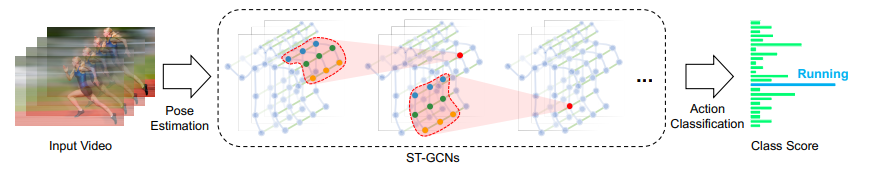

specific structure diagram of ST-GCN:

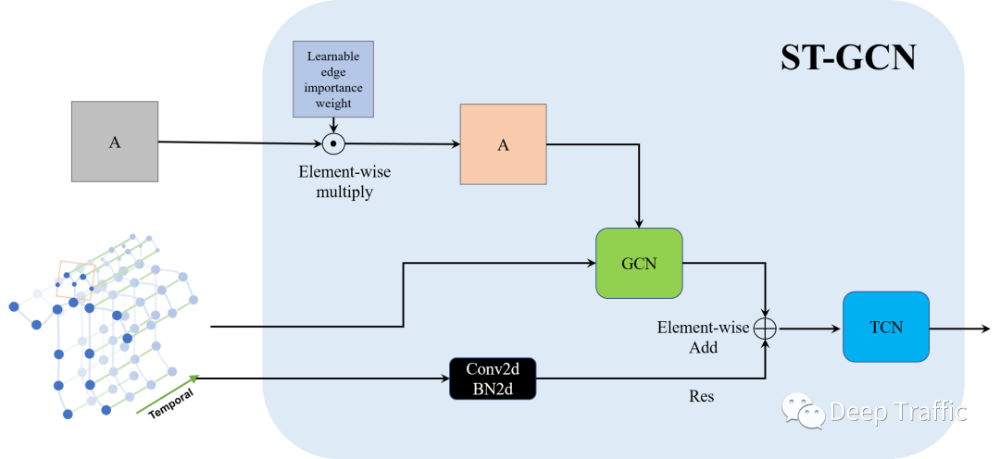

In [ ]:
!python /content/mmaction2/tools/train.py /content/ST-GCN.py --work-dir work_dirs --validate --test-best --gpus 2 --seed 0 --deterministic

/usr/local/lib/python3.8/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/content/mmaction2/mmaction/utils/setup_env.py:32: UserWarning: Setting OMP_NUM_THREADS environment variable for each process to be 1 in default, to avoid your system being overloaded, please further tune the variable for optimal performance in your application as needed.
  warnings.warn(
/content/mmaction2/mmaction/utils/setup

# EVALUATION

**Metrics: Top 1 Accuracy**

In [ ]:
!python /content/mmaction2/tools/test.py /content/ST-GCN.py \
   /content/checkpoint_94_test_100val.pth --eval top_k_accuracy  \
    --out result.pkl 

/usr/local/lib/python3.8/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/content/mmaction2/mmaction/utils/setup_env.py:32: UserWarning: Setting OMP_NUM_THREADS environment variable for each process to be 1 in default, to avoid your system being overloaded, please further tune the variable for optimal performance in your application as needed.
  warnings.warn(
/content/mmaction2/mmaction/utils/setup

**Plot result training in tensorboard**

In [ ]:
# load tensorboard in colab
%load_ext tensorboard

# see curves in tensorboard
%tensorboard --logdir /content/work_dirs/tf_logs



Output hidden; open in https://colab.research.google.com to view.

In [ ]:
!kill 2218

# ACTION RECOGNITION DEMO

In [ ]:
!python /content/mmaction2/demo/demo_skeleton.py /content/fall_18.mp4  out.mp4 --config /content/ST-GCN.py \
                                                                                              --checkpoint /content/work_dirs/latest.pth\
                                                                                              --det-config  '/content/mmdetection/configs/yolox/yolox_s_8x8_300e_coco.py'\
                                                                                              --det-checkpoint 'https://download.openmmlab.com/mmdetection/v2.0/yolox/yolox_s_8x8_300e_coco/yolox_s_8x8_300e_coco_20211121_095711-4592a793.pth'\
                                                                                              --pose-config '/content/mmpose/configs/body/2d_kpt_sview_rgb_img/topdown_heatmap/coco/hrnet_w48_coco_256x192.py'\
                                                                                              --pose-checkpoint 'https://download.openmmlab.com/mmpose/top_down/hrnet/hrnet_w48_coco_256x192-b9e0b3ab_20200708.pth'\
                                                                                              --det-score-thr 0.3\
                                                                                              --label-map /content/label.txt\
                                                                                           



/usr/local/lib/python3.8/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
load checkpoint from local path: /content/work_dirs/latest.pth
load checkpoint from http path: https://download.openmmlab.com/mmdetection/v2.0/yolox/yolox_s_8x8_300e_coco/yolox_s_8x8_300e_coco_20211121_095711-4592a793.pth
Downloading: "https://download.openmmlab.com/mmdetection/v2.0/yolox/yolox_s_8x8_300e_coco/yolox_s_8x8_300e_

In [ ]:
!python /content/mmaction2/demo/demo_skeleton.py /content/test_fall4.mp4  out_fall.mp4 --config /content/ST-GCN.py \
                                                                                              --checkpoint /content/checkpoint_94_test_100val.pth\
                                                                                              --det-config  '/content/mmdetection/configs/yolox/yolox_s_8x8_300e_coco.py'\
                                                                                              --det-checkpoint 'https://download.openmmlab.com/mmdetection/v2.0/yolox/yolox_s_8x8_300e_coco/yolox_s_8x8_300e_coco_20211121_095711-4592a793.pth'\
                                                                                              --pose-config '/content/mmpose/configs/body/2d_kpt_sview_rgb_img/topdown_heatmap/coco/hrnet_w48_coco_256x192.py'\
                                                                                              --pose-checkpoint 'https://download.openmmlab.com/mmpose/top_down/hrnet/hrnet_w48_coco_256x192-b9e0b3ab_20200708.pth'\
                                                                                              --det-score-thr 0.5\
                                                                                              --label-map /content/label.txt\
                                                                                           

/usr/local/lib/python3.8/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
load checkpoint from local path: /content/checkpoint_94_test_100val.pth
load checkpoint from http path: https://download.openmmlab.com/mmdetection/v2.0/yolox/yolox_s_8x8_300e_coco/yolox_s_8x8_300e_coco_20211121_095711-4592a793.pth
Performing Human Detection for each frame
[>>] 239/239, 30.2 task/s, elapsed: 8s, ETA:     0sload 

In [ ]:
!python /content/mmaction2/demo/demo_video_structuralize.py \
                    --skeleton-stdet-checkpoint /content/work_dirs/slowonly_r50_u48_240e_ntu120_xsub_keypoint/latest.pth \
                    --det-config '/content/mmdetection/configs/yolox/yolox_s_8x8_300e_coco.py' \
                    --det-checkpoint  'https://download.openmmlab.com/mmdetection/v2.0/yolox/yolox_s_8x8_300e_coco/yolox_s_8x8_300e_coco_20211121_095711-4592a793.pth'\
                    --pose-config '/content/mmpose/configs/body/2d_kpt_sview_rgb_img/topdown_heatmap/coco/hrnet_w48_coco_256x192.py'\
                    --pose-checkpoint 'https://download.openmmlab.com/mmpose/top_down/hrnet/hrnet_w48_coco_256x192-b9e0b3ab_20200708.pth' \
                    --skeleton-config /content/ST-GCN.py \
                    --skeleton-checkpoint /content/work_dirs/slowonly_r50_u48_240e_ntu120_xsub_keypoint/latest.pth \
                    --use-skeleton-stdet \
                    --label-map-stdet /content/label_stdet.txt \
                    --video /content/fall_20.mp4 --out-filename out_stdet.mp4



/usr/local/lib/python3.8/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
load checkpoint from http path: https://download.openmmlab.com/mmdetection/v2.0/yolox/yolox_s_8x8_300e_coco/yolox_s_8x8_300e_coco_20211121_095711-4592a793.pth
Performing Human Detection for each frame
[>>] 73/73, 20.1 task/s, elapsed: 4s, ETA:     0sload checkpoint from http path: https://download.openmmlab.com/mmpose/top_down/

In [ ]:
from IPython.display import HTML
from base64 import b64encode
 
def show_video(video_path, video_width = 600):
   
  video_file = open(video_path, "r+b").read()
 
  video_url = f"data:video/mp4;base64,{b64encode(video_file).decode()}"
  return HTML(f"""<video width={video_width} controls><source src="{video_url}"></video>""")

In [ ]:
show_video('/content/out_fall.mp4')

In [ ]:
from google.colab import files
files.download('/content/work_dirs/best_top1_acc_epoch_80.pth')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# PLot Train Loss Val Loss

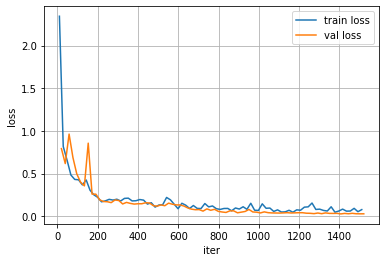

In [ ]:
import pandas as pd 
import numpy as np
train_loss = pd.read_csv('/content/run-.-tag-train_loss.csv')
val_loss = pd.read_csv('/content/run-.-tag-val_loss.csv')
iter_train = np.array(train_loss['Step'])
train_loss = np.array(train_loss['Value'])
iter_val = np.array(val_loss['Step'])
val_loss = np.array(val_loss['Value'])
plt.plot(iter_train, train_loss, label='train loss')
plt.plot(iter_val, val_loss, label='val loss')
plt.xlabel('iter')
plt.ylabel('loss')
plt.grid()

plt.legend()

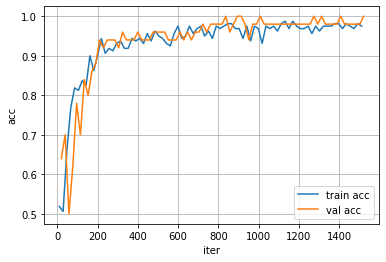

In [ ]:
import pandas as pd 
import numpy as np
train_loss = pd.read_csv('/content/run-.-tag-train_top1_acc.csv')
val_loss = pd.read_csv('/content/run-.-tag-val_top1_acc.csv')
iter_train = np.array(train_loss['Step'])
train_loss = np.array(train_loss['Value'])
iter_val = np.array(val_loss['Step'])
val_loss = np.array(val_loss['Value'])
plt.plot(iter_train, train_loss, label='train acc')
plt.plot(iter_val, val_loss, label='val acc')
plt.xlabel('iter')
plt.ylabel('acc')
plt.grid()

plt.legend()

In [ ]:
def load_json_annotations(ann_file):
    """Load json annotation file to get video information."""
    video_infos = mmcv.load(ann_file)
    num_videos = len(video_infos)
    path_key = 'frame_dir' if 'frame_dir' in video_infos[0] else 'filename'
    for i in range(num_videos):
        path_value = video_infos[i][path_key]
        if self.data_prefix is not None:
            path_value = osp.join(self.data_prefix, path_value)
        video_infos[i][path_key] = path_value
        if self.multi_class:
            assert self.num_classes is not None
        else:
            assert len(video_infos[i]['label']) == 1
            video_infos[i]['label'] = video_infos[i]['label'][0]
    return video_infos

# SPATIO-TEMPORAL ACTION DETECTION 

In [ ]:
!python /content/skeleton_stdet.py 